In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Вчитување на потребните библиотеки

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import LabelEncoder
import plotly.express as px
import plotly.graph_objects as go
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor

# Вчитување и истражување на датасетот

In [3]:
df = pd.read_csv('/content/drive/MyDrive/retail_store_inventory.csv')
df

,Date,Store ID,Product ID,Category,Region,Inventory Level,Units Sold,Units Ordered,Demand Forecast,Price,Discount,Weather Condition,Holiday/Promotion,Competitor Pricing,Seasonality
0,2022-01-01,S001,P0001,Groceries,North,231,127,55,135.47,33.50,20,Rainy,0,29.69,Autumn
1,2022-01-01,S001,P0002,Toys,South,204,150,66,144.04,63.01,20,Sunny,0,66.16,Autumn
2,2022-01-01,S001,P0003,Toys,West,102,65,51,74.02,27.99,10,Sunny,1,31.32,Summer
3,2022-01-01,S001,P0004,Toys,North,469,61,164,62.18,32.72,10,Cloudy,1,34.74,Autumn
4,2022-01-01,S001,P0005,Electronics,East,166,14,135,9.26,73.64,0,Sunny,0,68.95,Summer
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73095,2024-01-01,S005,P0016,Furniture,East,96,8,127,18.46,73.73,20,Snowy,0,72.45,Winter
73096,2024-01-01,S005,P0017,Toys,North,313,51,101,48.43,82.57,10,Cloudy,0,83.78,Autumn
73097,2024-01-01,S005,P0018,Clothing,West,278,36,151,39.65,11.11,10,Rainy,0,10.91,Winter
73098,2024-01-01,S005,P0019,Toys,East,374,264,21,270.52,53.14,20,Rainy,0,55.80,Spring


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73100 entries, 0 to 73099
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Date                73100 non-null  object 
 1   Store ID            73100 non-null  object 
 2   Product ID          73100 non-null  object 
 3   Category            73100 non-null  object 
 4   Region              73100 non-null  object 
 5   Inventory Level     73100 non-null  int64  
 6   Units Sold          73100 non-null  int64  
 7   Units Ordered       73100 non-null  int64  
 8   Demand Forecast     73100 non-null  float64
 9   Price               73100 non-null  float64
 10  Discount            73100 non-null  int64  
 11  Weather Condition   73100 non-null  object 
 12  Holiday/Promotion   73100 non-null  int64  
 13  Competitor Pricing  73100 non-null  float64
 14  Seasonality         73100 non-null  object 
dtypes: float64(3), int64(5), object(7)
memory usage: 8.4+

In [5]:
df.isnull().sum()

,0
Date,0
Store ID,0
Product ID,0
Category,0
Region,0
Inventory Level,0
Units Sold,0
Units Ordered,0
Demand Forecast,0
Price,0


# Визуелизации на датасетот

Text(0, 0.5, 'Frequency')

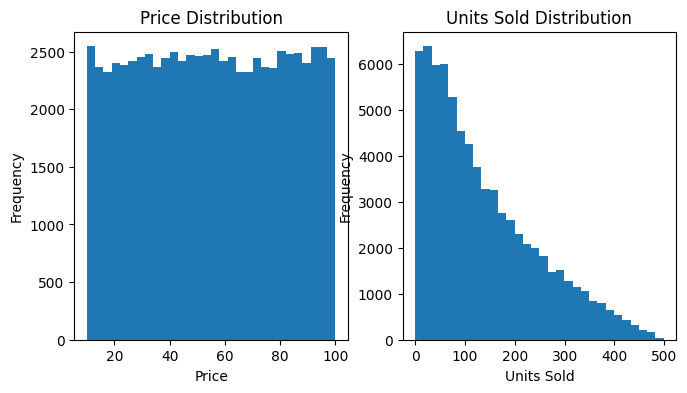

In [6]:
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.hist(df['Price'], bins=30)
plt.title('Price Distribution')
plt.xlabel('Price')
plt.ylabel('Frequency')

plt.subplot(1, 3, 2)
plt.hist(df['Units Sold'], bins=30)
plt.title('Units Sold Distribution')
plt.xlabel('Units Sold')
plt.ylabel('Frequency')

In [7]:
fig = px.scatter(df, x='Price',
                 y='Demand Forecast',
                 title='Price vs Demand Forecast',
                 trendline='ols')
fig.show()

In [8]:
fig = px.scatter(df, x='Price',
                 y='Units Sold',
                 title='Price vs Units Sold',
                 trendline='ols')
fig.show()

In [9]:
fig = px.scatter(df, x='Units Sold',
                 y='Demand Forecast',
                 title='Units Sold vs Demand Forecast',
                 trendline='ols')
fig.show()

In [10]:
fig = px.box(df, x='Category',
             y='Price',
             title='Price Distribution by Category')
fig.show()

In [11]:
fig = px.box(df, x='Seasonality',
             y='Price',
             title='Price Distribution by Seasonality')
fig.show()

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73100 entries, 0 to 73099
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Date                73100 non-null  object 
 1   Store ID            73100 non-null  object 
 2   Product ID          73100 non-null  object 
 3   Category            73100 non-null  object 
 4   Region              73100 non-null  object 
 5   Inventory Level     73100 non-null  int64  
 6   Units Sold          73100 non-null  int64  
 7   Units Ordered       73100 non-null  int64  
 8   Demand Forecast     73100 non-null  float64
 9   Price               73100 non-null  float64
 10  Discount            73100 non-null  int64  
 11  Weather Condition   73100 non-null  object 
 12  Holiday/Promotion   73100 non-null  int64  
 13  Competitor Pricing  73100 non-null  float64
 14  Seasonality         73100 non-null  object 
dtypes: float64(3), int64(5), object(7)
memory usage: 8.4+

In [13]:
numeric_features = df.select_dtypes(include=['int64', 'float64'])

In [14]:
corr_matrix = numeric_features.corr()

fig = go.Figure(data=go.Heatmap(z=corr_matrix.values,
                                x=corr_matrix.columns,
                                y=corr_matrix.columns,
                                colorscale='Viridis'))
fig.update_layout(title='Correlation Matrix')
fig.show()

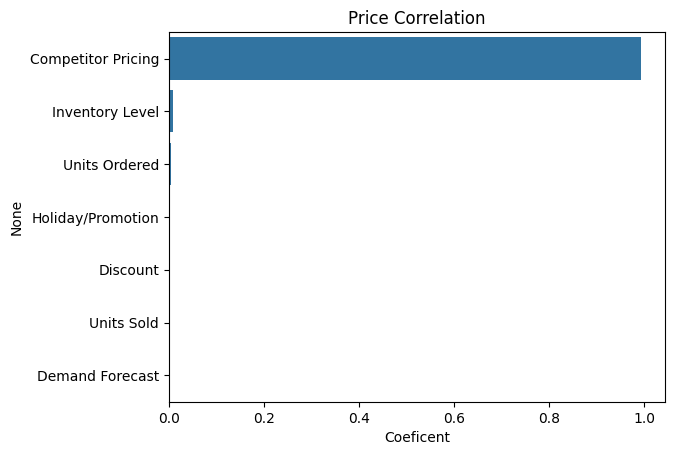

In [15]:
corr = df.corr(numeric_only=True)
top_corr_features = corr['Price'].abs().sort_values(ascending=False)[1:11]
sns.barplot(x=top_corr_features.values, y=top_corr_features.index)
plt.title("Price Correlation")
plt.xlabel("Coeficent")
plt.show()

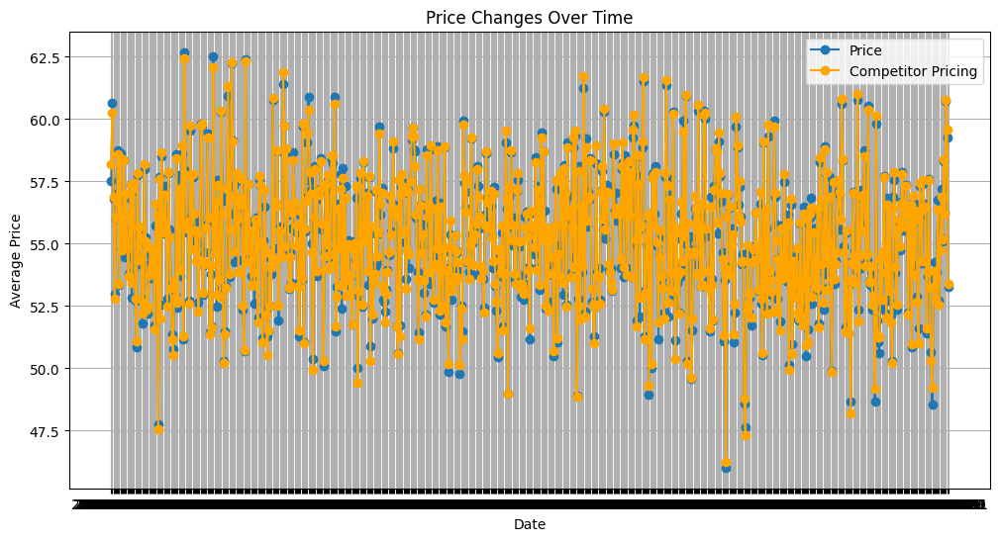

In [16]:
weekly_prices = df.groupby('Date').agg({
    'Price': 'mean',
    'Competitor Pricing': 'mean'
}).reset_index()

plt.figure(figsize=(12, 6))

plt.plot(weekly_prices['Date'], weekly_prices['Price'], label='Price', marker='o')
plt.plot(weekly_prices['Date'], weekly_prices['Competitor Pricing'], label='Competitor Pricing', marker='o', color='orange')

plt.xlabel('Date')
plt.ylabel('Average Price')
plt.title('Price Changes Over Time')
plt.legend()
plt.grid(True)
plt.show()

# Средување и подготовка на податоците

In [17]:
df['Date'] = pd.to_datetime(df['Date'])

In [18]:
df.sort_values('Date', inplace=True)
df.head(10)

,Date,Store ID,Product ID,Category,Region,Inventory Level,Units Sold,Units Ordered,Demand Forecast,Price,Discount,Weather Condition,Holiday/Promotion,Competitor Pricing,Seasonality
0,2022-01-01,S001,P0001,Groceries,North,231,127,55,135.47,33.50,20,Rainy,0,29.69,Autumn
72,2022-01-01,S004,P0013,Furniture,East,191,56,65,54.47,61.81,0,Sunny,0,63.92,Autumn
71,2022-01-01,S004,P0012,Electronics,North,349,9,165,0.95,14.25,5,Rainy,1,18.56,Spring
70,2022-01-01,S004,P0011,Electronics,West,205,46,27,46.65,54.84,0,Sunny,1,57.76,Spring
69,2022-01-01,S004,P0010,Groceries,East,447,104,96,115.03,33.48,15,Cloudy,0,37.15,Summer
68,2022-01-01,S004,P0009,Furniture,North,63,40,73,51.78,59.23,10,Rainy,1,61.10,Summer
67,2022-01-01,S004,P0008,Furniture,South,250,51,137,54.98,85.88,20,Snowy,1,86.14,Winter
66,2022-01-01,S004,P0007,Electronics,West,264,190,139,197.45,67.26,20,Cloudy,0,64.78,Summer
65,2022-01-01,S004,P0006,Electronics,East,470,382,195,396.40,41.35,10,Snowy,0,39.86,Summer
64,2022-01-01,S004,P0005,Groceries,North,397,200,172,196.57,81.72,0,Snowy,1,85.22,Spring


In [19]:
df = pd.get_dummies(df, columns = ['Category', 'Region', 'Weather Condition', 'Seasonality'], drop_first=True, dtype=int)

In [20]:
df['Store ID'] = LabelEncoder().fit_transform(df['Store ID'])
df['Product ID'] = LabelEncoder().fit_transform(df['Product ID'])

In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 73100 entries, 0 to 73099
Data columns (total 24 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   Date                     73100 non-null  datetime64[ns]
 1   Store ID                 73100 non-null  int64         
 2   Product ID               73100 non-null  int64         
 3   Inventory Level          73100 non-null  int64         
 4   Units Sold               73100 non-null  int64         
 5   Units Ordered            73100 non-null  int64         
 6   Demand Forecast          73100 non-null  float64       
 7   Price                    73100 non-null  float64       
 8   Discount                 73100 non-null  int64         
 9   Holiday/Promotion        73100 non-null  int64         
 10  Competitor Pricing       73100 non-null  float64       
 11  Category_Electronics     73100 non-null  int64         
 12  Category_Furniture       73100 non-nu

In [22]:
df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month
df['Day'] = df['Date'].dt.day
df['Dayofweek'] = df['Date'].dt.dayofweek

In [23]:
df

,Date,Store ID,Product ID,Inventory Level,Units Sold,Units Ordered,Demand Forecast,Price,Discount,Holiday/Promotion,...,Weather Condition_Rainy,Weather Condition_Snowy,Weather Condition_Sunny,Seasonality_Spring,Seasonality_Summer,Seasonality_Winter,Year,Month,Day,Dayofweek
0,2022-01-01,0,0,231,127,55,135.47,33.50,20,0,...,1,0,0,0,0,0,2022,1,1,5
72,2022-01-01,3,12,191,56,65,54.47,61.81,0,0,...,0,0,1,0,0,0,2022,1,1,5
71,2022-01-01,3,11,349,9,165,0.95,14.25,5,1,...,1,0,0,1,0,0,2022,1,1,5
70,2022-01-01,3,10,205,46,27,46.65,54.84,0,1,...,0,0,1,1,0,0,2022,1,1,5
69,2022-01-01,3,9,447,104,96,115.03,33.48,15,0,...,0,0,0,0,1,0,2022,1,1,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73027,2024-01-01,1,7,218,43,144,51.52,90.38,10,0,...,0,0,1,0,0,0,2024,1,1,0
73026,2024-01-01,1,6,53,2,40,-6.08,63.66,20,1,...,0,1,0,0,0,0,2024,1,1,0
73025,2024-01-01,1,5,160,159,78,151.48,19.06,20,1,...,1,0,0,0,0,0,2024,1,1,0
73035,2024-01-01,1,15,258,110,197,107.61,41.30,5,0,...,0,0,0,0,0,0,2024,1,1,0


In [24]:
df['Price_lag1'] = df['Price'].shift(1)
df['Price_roll7'] = df.groupby('Product ID')['Price'].transform(lambda x: x.rolling(window=7, min_periods=1).mean())

df['UnitsSold_lag1'] = df['Units Sold'].shift(1)
df['UnitsSold_roll7'] = df.groupby('Product ID')['Units Sold'].transform(lambda x: x.rolling(window=7, min_periods=1).mean())

In [25]:
df.isnull().sum()

,0
Date,0
Store ID,0
Product ID,0
Inventory Level,0
Units Sold,0
Units Ordered,0
Demand Forecast,0
Price,0
Discount,0
Holiday/Promotion,0


In [26]:
df.dropna(inplace=True)

In [27]:
df.isnull().sum()

,0
Date,0
Store ID,0
Product ID,0
Inventory Level,0
Units Sold,0
Units Ordered,0
Demand Forecast,0
Price,0
Discount,0
Holiday/Promotion,0


In [28]:
df.head(5)

,Date,Store ID,Product ID,Inventory Level,Units Sold,Units Ordered,Demand Forecast,Price,Discount,Holiday/Promotion,...,Seasonality_Summer,Seasonality_Winter,Year,Month,Day,Dayofweek,Price_lag1,Price_roll7,UnitsSold_lag1,UnitsSold_roll7
72,2022-01-01,3,12,191,56,65,54.47,61.81,0,0,...,0,0,2022,1,1,5,33.50,61.81,127.0,56.0
71,2022-01-01,3,11,349,9,165,0.95,14.25,5,1,...,0,0,2022,1,1,5,61.81,14.25,56.0,9.0
70,2022-01-01,3,10,205,46,27,46.65,54.84,0,1,...,0,0,2022,1,1,5,14.25,54.84,9.0,46.0
69,2022-01-01,3,9,447,104,96,115.03,33.48,15,0,...,1,0,2022,1,1,5,54.84,33.48,46.0,104.0
68,2022-01-01,3,8,63,40,73,51.78,59.23,10,1,...,1,0,2022,1,1,5,33.48,59.23,104.0,40.0


# Поделување на датасетот на тренирачко и тестирачко множество

In [29]:
df = df.sort_values('Date').reset_index(drop=True)

In [30]:
X = df.drop(columns=['Price', 'Date'])
y = df['Price']

In [31]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

# Тренирање и еваулација на XGBoost моделот

In [32]:
xgb_model = XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=5, random_state=42)
xgb_model.fit(X_train, y_train)
y_pred_xgb = xgb_model.predict(X_test)

In [33]:
mae_xgb = mean_absolute_error(y_test, y_pred_xgb)
rmse_xgb = np.sqrt(mean_squared_error(y_test, y_pred_xgb))
print(f"Mean Absolute Error (MAE): {mae_xgb:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse_xgb:.4f}")
print(f"R² Score: {r2_score(y_test, y_pred_xgb):.4f}")

Mean Absolute Error (MAE): 2.4064
Root Mean Squared Error (RMSE): 2.8063
R² Score: 0.9883


In [35]:
sample_size = 500
sample_indices = np.random.choice(len(y_test), size=sample_size, replace=False)
sample_indices.sort()

test_row_labels = y_test.index[sample_indices]

sample_dates = df['Date'].loc[test_row_labels].reset_index(drop=True)

y_test_sample = y_test.iloc[sample_indices].reset_index(drop=True)
y_pred_xgb_sample = y_pred_xgb[sample_indices]

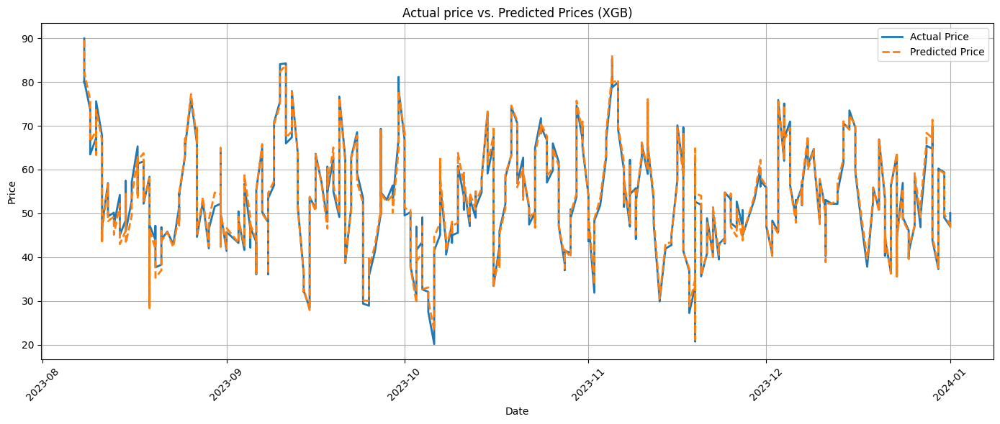

In [36]:
window = 5

actual_prices = y_test_sample.values
predicted_prices = y_pred_xgb_sample

actual_prices = pd.Series(actual_prices).rolling(window=window, min_periods=1).mean()
predicted_prices = pd.Series(predicted_prices).rolling(window=window, min_periods=1).mean()

plt.figure(figsize=(14, 6))
plt.plot(sample_dates, actual_prices, label='Actual Price', linestyle='-', linewidth=2)
plt.plot(sample_dates, predicted_prices, label='Predicted Price', linestyle='--', linewidth=2)

plt.xlabel('Date')
plt.ylabel('Price')
plt.title('Actual price vs. Predicted Prices (XGB)')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.grid(True)
plt.show()

# Анализа на карактеристиките на XGBoost моделот со и без Competitor Pricing


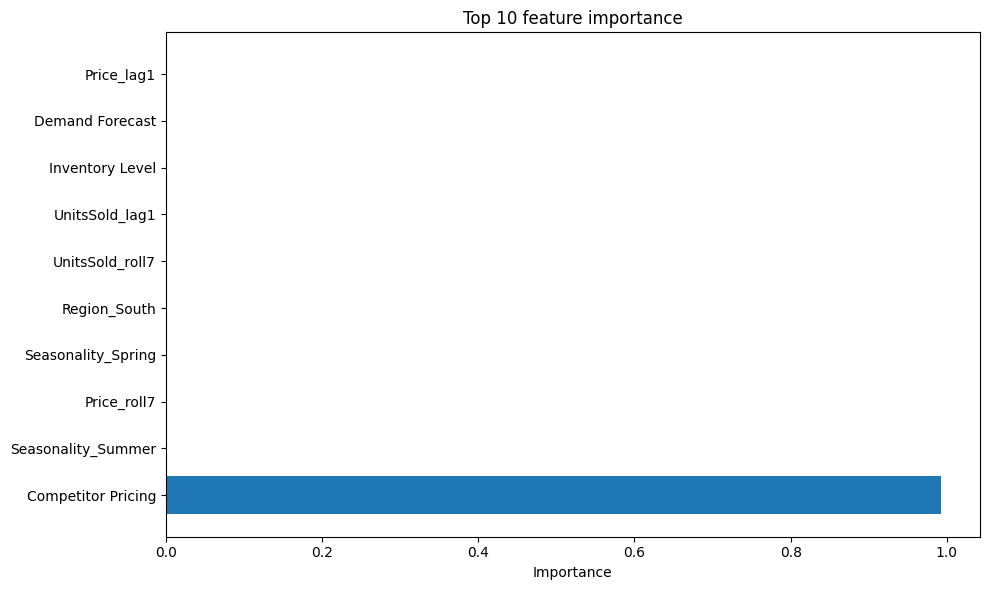

In [37]:
feature_importance = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': xgb_model.feature_importances_
}).sort_values('Importance', ascending=False)

plt.figure(figsize=(10, 6))
plt.barh(feature_importance['Feature'].head(10), feature_importance['Importance'].head(10))
plt.title('Top 10 feature importance')
plt.xlabel('Importance')
plt.tight_layout()
plt.show()

In [38]:
X_train_no_comp, X_test_no_comp, y_train_no_comp, y_test_no_comp = train_test_split(X, y, test_size=0.2, shuffle=False)

In [39]:
X_train_no_comp = X_train_no_comp.drop('Competitor Pricing', axis=1, errors='ignore')
X_test_no_comp = X_test_no_comp.drop('Competitor Pricing', axis=1, errors='ignore')

from xgboost import XGBRegressor
model_no_comp = XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=5, random_state=42)
model_no_comp.fit(X_train_no_comp, y_train_no_comp)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=100, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

In [40]:
y_pred_nocomp = model_no_comp.predict(X_test_no_comp)

mae_nocomp = mean_absolute_error(y_test_no_comp, y_pred_nocomp)
mse_nocomp = mean_squared_error(y_test_no_comp, y_pred_nocomp)
rmse_nocomp = np.sqrt(mse_nocomp)

print(f"Mean Absolute Error (MAE):  {mae_nocomp:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse_nocomp:.2f}")
print(f"R² Score: {r2_score(y_test_no_comp, y_pred_nocomp):.2f}")

Mean Absolute Error (MAE):  20.39
Root Mean Squared Error (RMSE): 24.11
R² Score: 0.14


In [41]:
sample_size = 500
sample_indices = np.random.choice(len(y_test_no_comp), size=sample_size, replace=False)
sample_indices.sort()

test_row_labels = y_test_no_comp.index[sample_indices]

sample_dates = df['Date'].loc[test_row_labels].reset_index(drop=True)

y_test_no_comp_sample = y_test_no_comp.iloc[sample_indices].reset_index(drop=True)
y_pred_no_comp_sample = y_pred_nocomp[sample_indices]

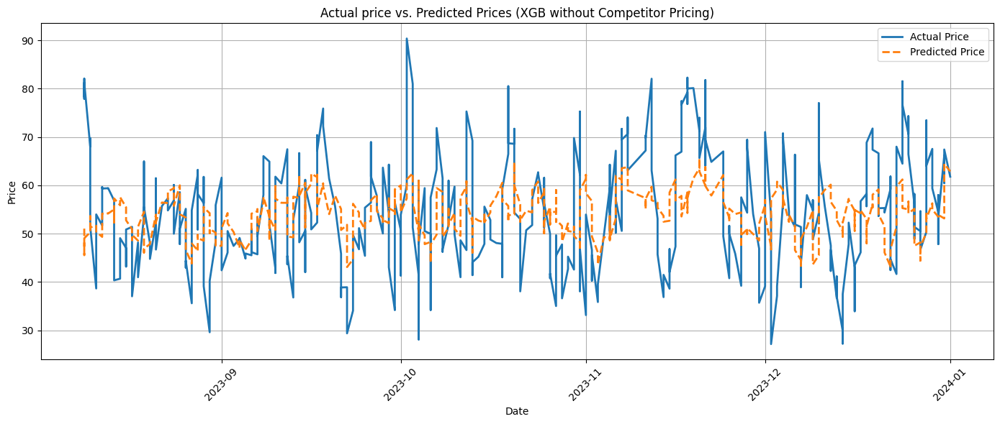

In [42]:
window = 5

actual_prices = y_test_no_comp_sample.values
predicted_prices = y_pred_no_comp_sample

actual_prices = pd.Series(actual_prices).rolling(window=window, min_periods=1).mean()
predicted_prices = pd.Series(predicted_prices).rolling(window=window, min_periods=1).mean()

plt.figure(figsize=(14, 6))
plt.plot(sample_dates, actual_prices, label='Actual Price', linestyle='-', linewidth=2)
plt.plot(sample_dates, predicted_prices, label='Predicted Price', linestyle='--', linewidth=2)

plt.xlabel('Date')
plt.ylabel('Price')
plt.title('Actual price vs. Predicted Prices (XGB without Competitor Pricing)')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.grid(True)
plt.show()

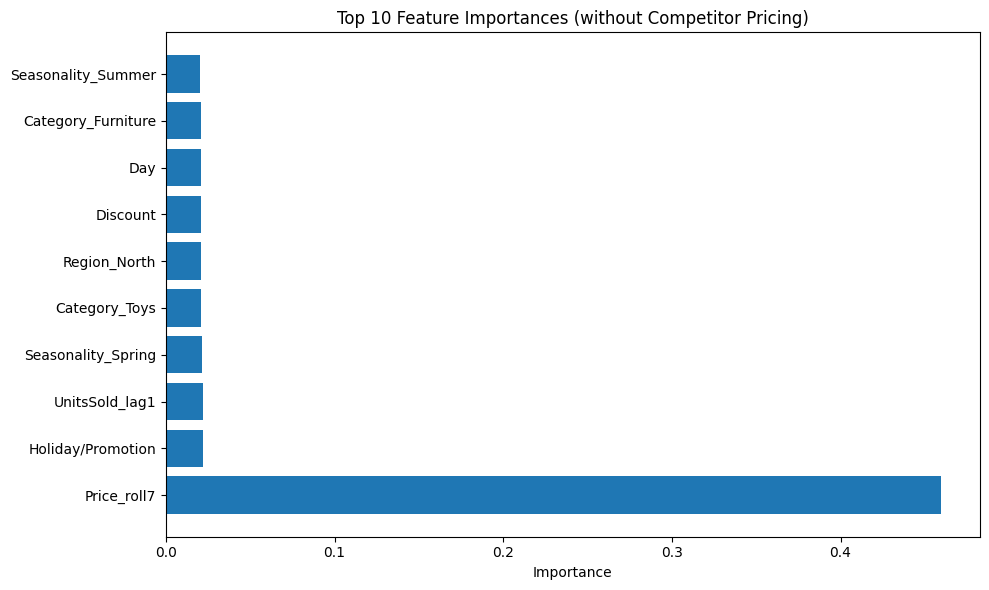

In [43]:
feature_importance = pd.DataFrame({
    'Feature': X_train_no_comp.columns,
    'Importance': model_no_comp.feature_importances_
}).sort_values('Importance', ascending=False)

plt.figure(figsize=(10, 6))
plt.barh(feature_importance['Feature'].head(10), feature_importance['Importance'].head(10))
plt.title('Top 10 Feature Importances (without Competitor Pricing)')
plt.xlabel('Importance')
plt.tight_layout()
plt.show()

# Тренирање и еваулација на RandomForest моделот

In [44]:
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

y_pred_rf = rf_model.predict(X_test)

mae_rf = mean_absolute_error(y_test, y_pred_rf)
mse_rf = mean_squared_error(y_test, y_pred_rf)
rmse_rf = np.sqrt(mse_rf)

In [45]:
print(f"Mean Absolute Error (MAE): {mae_rf:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse_rf:.4f}")
print(f"R² Score: {r2_score(y_test, y_pred_rf):.4f}")

Mean Absolute Error (MAE): 2.4315
Root Mean Squared Error (RMSE): 2.8452
R² Score: 0.9880


In [46]:
sample_size = 500
sample_indices = np.random.choice(len(y_test), size=sample_size, replace=False)
sample_indices.sort()

test_row_labels = y_test.index[sample_indices]

sample_dates = df['Date'].loc[test_row_labels].reset_index(drop=True)

y_test_sample = y_test.iloc[sample_indices].reset_index(drop=True)
y_pred_rf_sample = y_pred_rf[sample_indices]

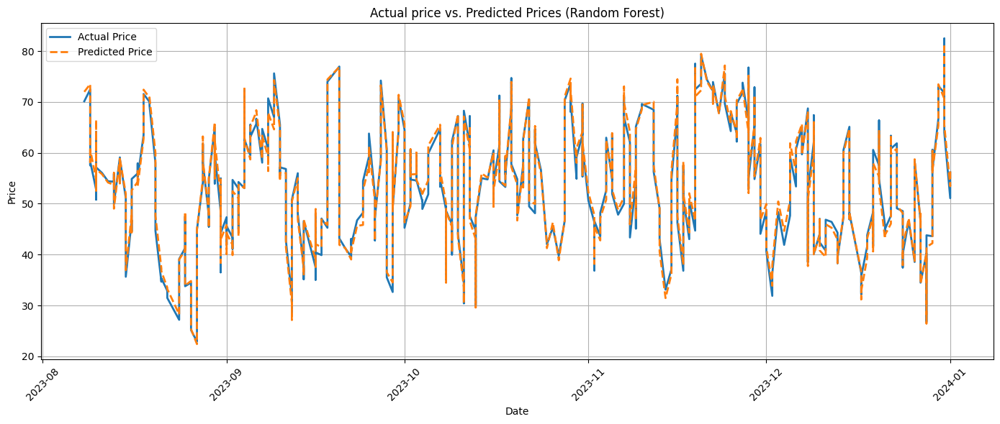

In [47]:
window = 5

actual_prices = y_test_sample.values
predicted_prices = y_pred_rf_sample

actual_prices = pd.Series(actual_prices).rolling(window=window, min_periods=1).mean()
predicted_prices = pd.Series(predicted_prices).rolling(window=window, min_periods=1).mean()

plt.figure(figsize=(14, 6))
plt.plot(sample_dates, actual_prices, label='Actual Price', linestyle='-', linewidth=2)
plt.plot(sample_dates, predicted_prices, label='Predicted Price', linestyle='--', linewidth=2)

plt.xlabel('Date')
plt.ylabel('Price')
plt.title('Actual price vs. Predicted Prices (Random Forest)')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.grid(True)
plt.show()

# Визуелна споредба на резултатите

In [48]:
prices = pd.DataFrame({
    "Actual Price": y_test,
    "Competitor Pricing": X_test['Competitor Pricing'],
    "Predicted Price(XGB)": y_pred_xgb,
    "Predicted Price(XGB_NoComp)": y_pred_nocomp,
    "Predicted Price(Random Forest)": y_pred_rf,
}, index=y_test.index)

In [49]:
print("Pricing:")
prices['Date'] = df.loc[y_test.index, 'Date'].values
prices.set_index('Date', inplace=True)
prices.sample(15)

Pricing:


,Actual Price,Competitor Pricing,Predicted Price(XGB),Predicted Price(XGB_NoComp),Predicted Price(Random Forest)
Date,,,,,
2023-12-19,58.85,60.36,59.755836,63.441177,60.8345
2023-10-13,35.85,31.22,31.727358,55.677319,30.9031
2023-12-16,15.47,11.65,13.383751,38.200756,13.3851
2023-08-15,34.42,33.59,34.229954,71.404640,33.9041
2023-12-15,11.66,10.59,12.667549,38.364426,12.8023
2023-10-03,70.38,66.92,66.870361,39.082012,66.4699
2023-10-22,11.45,9.92,12.382031,39.771839,12.7607
2023-12-24,38.04,37.88,38.357910,54.097218,37.2141
2023-11-21,87.69,84.63,84.845711,53.495438,83.8069


In [51]:
sampled_results = prices.sample(n=100, random_state=42).sort_index()

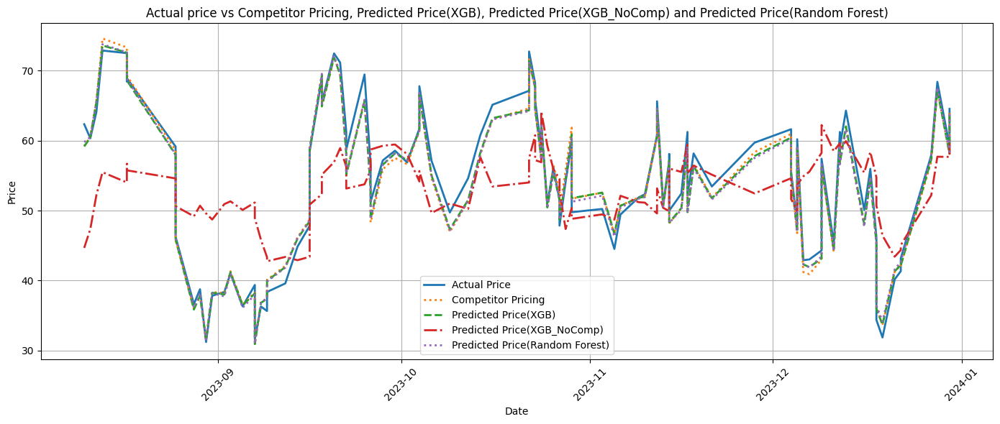

In [52]:
window = 5

sampled_results = sampled_results.rolling(window=window, min_periods=1).mean()

plt.figure(figsize=(14, 6))
plt.plot(sampled_results.index, sampled_results['Actual Price'], label='Actual Price', linestyle='-', linewidth=2)
plt.plot(sampled_results.index, sampled_results['Competitor Pricing'], label='Competitor Pricing', linestyle=':', linewidth=2)
plt.plot(sampled_results.index, sampled_results['Predicted Price(XGB)'], label='Predicted Price(XGB)', linestyle='--', linewidth=2)
plt.plot(sampled_results.index, sampled_results['Predicted Price(XGB_NoComp)'], label='Predicted Price(XGB_NoComp)', linestyle='-.', linewidth=2)
plt.plot(sampled_results.index, sampled_results['Predicted Price(Random Forest)'], label='Predicted Price(Random Forest)', linestyle=':', linewidth=2)


plt.xlabel('Date')
plt.ylabel('Price')
plt.title('Actual price vs Competitor Pricing, Predicted Price(XGB), Predicted Price(XGB_NoComp) and Predicted Price(Random Forest)')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
